# Increasing and decreasing genes with age

This notebook contains code for determining increasing and decreasing genes with age on the 300 MERFISH genes in the coronal section dataset. To model multiple ages and potentially nonlinear changes in expression with age, we identify differentially expressed genes using Spearman correlation analysis. Included in this notebook are also traditional differential gene expression analysis for the exercise and partial reprogramming datasets.

**Associated manuscript figures/tables:**
- Figures: 1f, 1j
- Extended Data Figures: 1c; 4a,b
- Supplementary Table 7 (partial)


**Inputs required:**
- `data/integrated_aging_coronal_celltyped_regioned_raw.h5ad` - AnnData object for coronal sections dataset
- `data/integrated_aging_sagittal_clustered_registered_raw.h5ad` - AnnData object for sagittal sections dataset
- `data/integrated_exercise_coronal_celltyped_regioned_raw.h5ad` - AnnData object for exercise dataset
- `data/integrated_reprogramming_coronal_celltyped_regioned_raw.h5ad` - AnnData object for reprogramming dataset
- `results/pathway_enrichment/go_de_ci_BP.xlsx` - spreadsheet containing GO biological process enrichment results for the increasing/decreasing genes (generated from `go_analysis.R` and also corresponds to Supplementary Table 8)

**Conda environment used**: `requirements/merfish.txt`

In [1]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
import seaborn as sns
import anndata as ad
import os
from scipy.stats import pearsonr, spearmanr, mannwhitneyu, ttest_ind, hypergeom
import matplotlib.colors as mcolors

import statsmodels.api as sm
from statsmodels.stats.multitest import multipletests
import pickle
import gseapy as gp
from decimal import Decimal

from clock_preprocessing import *

In [2]:
celltype_palette = {'Neuron-Excitatory':'forestgreen',
                        'Neuron-Inhibitory':'lightgreen',
                        'Neuron-MSN':'yellowgreen',
                        'Astrocyte': 'royalblue',
                        'Microglia': 'aqua',
                        'Oligodendrocyte': 'skyblue',
                        'OPC': 'deepskyblue',
                        'Endothelial': 'red',
                        'Pericyte': 'darkred',
                        'VSMC': 'salmon',
                        'VLMC': 'indianred',
                        'Ependymal': 'gray',
                        'Neuroblast': 'sandybrown',
                        'NSC':'darkorange',
                        'Macrophage':'purple',
                        'Neutrophil':'darkviolet',
                        'T cell':'magenta',
                        'B cell':'orchid',
                        'Unknown': '0.9'}

## Spearman correlation analysis for differentially expressed genes

In [3]:
def correlation_confidence_interval(r,n,ci=0.95):
    '''
    Given correlation (r), number of samples (n), and confidence interval (ci).
    Computes the confidence interval lower and upper bounds for r
    '''
    from scipy.stats import norm
    import math
    
    z = norm.ppf(1-(1-ci)/2)
    lower = math.tanh(math.atanh(r)-z/np.sqrt(n-3))
    upper = math.tanh(math.atanh(r)+z/np.sqrt(n-3))
    
    return((lower,upper))

In [ ]:
# for correlation, don't need z-scores and make bulking better defined

adata = sc.read_h5ad("data/integrated_aging_coronal_celltyped_regioned_raw.h5ad")

adata = normalize_adata (adata, zscore=False)

In [ ]:
# Differential Gene Expression

dgea_dict = {}

for celltype in np.unique(adata.obs.celltype):
    
    # subset cell type
    sub_adata = adata[adata.obs.celltype==celltype]
    
    # init dict
    dgea_dict[celltype] = {}
    dgea_dict[celltype]["gene"] = []
    dgea_dict[celltype]["spearman"] = []
    dgea_dict[celltype]["p-value"] = []
    dgea_dict[celltype]["ci_95_low"] = []
    dgea_dict[celltype]["ci_95_high"] = []

    for gene in sub_adata.var_names:
        Y = sub_adata[:,gene].X.flatten()
        X = sub_adata.obs['age'].values
        # group and sample bulk
        exp_df = pd.DataFrame([])
        exp_df["exp"] = Y
        exp_df["age"] = X
        exp_df = exp_df.groupby('age',as_index=False).agg({'exp':'mean'})
        Y = exp_df["exp"].values
        X = exp_df["age"].values
        # spearman
        spear = spearmanr(X,Y)
        ci95 = correlation_confidence_interval(spear[0],len(X),ci=0.95)
        # get results
        dgea_dict[celltype]["gene"].append(gene)
        dgea_dict[celltype]["spearman"].append(spear[0])
        dgea_dict[celltype]["p-value"].append(spear[1])
        dgea_dict[celltype]["ci_95_low"].append(ci95[0])
        dgea_dict[celltype]["ci_95_high"].append(ci95[1])

In [11]:
# # save results
# with open('results/dgea/celltype_dgea_spearman_combinedbulked.pkl', 'wb') as handle:
#     pickle.dump(dgea_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [4]:
# load results
with open('results/dgea/celltype_dgea_spearman_combinedbulked.pkl', 'rb') as handle:
    dgea_dict = pickle.load(handle)
    
# list of genes to exclude (based on segmentation)
# >5% misallocation by Vizgen internal metric
exclude_markers = ['Gfap', 'Crym', 'Drd2', 'Nr4a2', 'Ighm', 'Slc17a7', 'Aldoc', 'Adora2a', 'Cd4', 'C1ql3', 'Stmn2', 'Pvalb', 'Thbs4', 'Gja1', 'Atp1a2', 'C4b', 'Drd1', 'Lamp5', 'Slc1a2', 'Sparc', 'Map1lc3a', 'Tox', 'Penk', 'Gad2', 'Chat', 'Apoe', 'Aqp4', 'Sulf2', 'Sox9', 'Clu', 'Tubb3', 'Slc32a1', 'Aldh1l1', 'Spock2', 'Nfic', 'Olig1', 'Flt1', 'Pbx3', 'Pdgfra', 'Adamts3', 'Tac1', 'Cdh2', 'Slc1a3', 'Agpat3', 'Fgfr3', 'Msmo1', 'Ntm', 'Efnb2', 'Apod', 'Cd47', 'Gad1', 'Cdk5r1', 'Cfl1', 'Jak1', 'Sst', 'Sox2', 'Dpp6', 'Stub1', 'Igf2', 'Elovl5', 'Fads2', 'Trim2', 'Syt11', 'C1qa', 'Npy', 'Htt', 'Pcsk1n', 'Akt1', 'Csf1r', 'Igf1r', 'Sox11', 'Slc17a6', 'Mtor', 'C1qb', 'Sod2', 'Btg2', 'Gpm6b', 'Vcam1', 'Nr2e1', 'Parp1']

# deleted excluded genes from dict
for key in dgea_dict.keys():
    del_idxs = pd.Series(dgea_dict[key]['gene']).isin(exclude_markers).values
    for key2 in dgea_dict[key].keys():
        cparr = np.array(dgea_dict[key][key2])[~del_idxs]
        dgea_dict[key][key2] = list(cparr)

In [5]:
# save results as CSV
for ki, key in enumerate(dgea_dict.keys()):
    
    key_df = pd.DataFrame([])
    key_df["gene"] = dgea_dict[key]['gene']
    key_df[f"{key}_PValue"] = dgea_dict[key]['p-value']
    key_df[f"{key}_Spearman"] = dgea_dict[key]['spearman']
    key_df[f"{key}_Lower95CI"] = dgea_dict[key]['ci_95_low']
    key_df[f"{key}_Upper95CI"] = dgea_dict[key]['ci_95_high']
    
    if ki == 0:
        combined_df = key_df
    else:
        combined_df = pd.merge(combined_df,key_df,on="gene")
    
combined_df.to_csv("results/dgea/celltype_dgea_spearman_combinedbulked.csv", index=False)

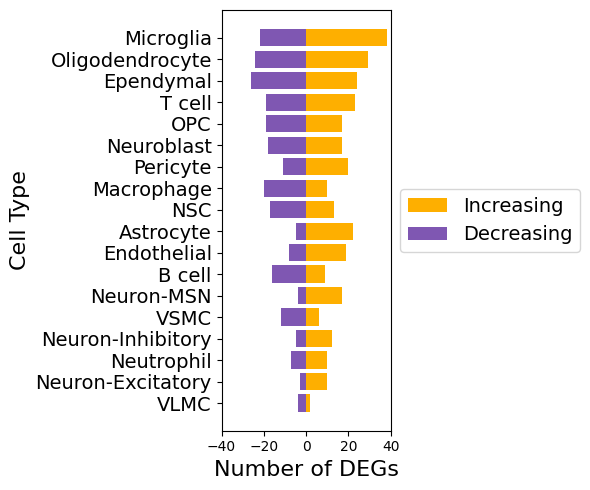

In [6]:
# Confidence interval for Spearmanr cutoff (0.25)
# make deg frequency plot

nrows = 2
ncols = 9

celltype_list = []
num_pos = []
num_neg = []


counter = 0
for i in range(nrows):
    for j in range(ncols):
        
        celltype = list(dgea_dict.keys())[counter]
                
        # get stats
        coefs = np.array(dgea_dict[celltype]['spearman'])
        pvals = np.array(dgea_dict[celltype]['p-value'])
        lowbounds = np.array(dgea_dict[celltype]['ci_95_low'])
        hibounds = np.array(dgea_dict[celltype]['ci_95_high'])
        
        # add values
        celltype_list.append(celltype)
        num_pos.append(np.sum((coefs>0.3)&(lowbounds>0)))
        num_neg.append(np.sum((coefs<-0.3)&(hibounds<0)))
        counter += 1

# re-order
total_num = [num_pos[i]+num_neg[i] for i in range(len(celltype_list))]
celltype_list = np.array(celltype_list)[np.argsort(total_num)]
num_pos = np.array(num_pos)[np.argsort(total_num)]
num_neg = np.array(num_neg)[np.argsort(total_num)]
        
        
plt.figure(figsize=(6,5))
plt.barh(np.arange(len(celltype_list)), np.array(num_pos), color='#FEAF00', label="Increasing")
plt.barh(np.arange(len(celltype_list)), -np.array(num_neg), color='#7F57B2', label="Decreasing")
plt.yticks(np.arange(len(celltype_list)), celltype_list, fontsize=12)
plt.yticks(fontsize=14)
plt.xlabel("Number of DEGs", fontsize=16)
plt.ylabel("Cell Type", fontsize=16)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
plt.xlim(-40,40)
plt.tight_layout()
plt.savefig("plots/dgea/horizontal_bar_degs_CISpear0cutoff_spearman.pdf", dpi=300, bbox_inches='tight')
plt.show()

## Pathway enrichment analysis

In [3]:
# read in Excel results
df_dict = pd.read_excel("results/pathway_enrichment/go_de_ci_BP.xlsx",
                   sheet_name=None)

In [4]:
# go through sheets and collect into one dataframe

top_n = 3

top_df_list = []
df_list = []

for sheet in df_dict.keys():
    sdf = df_dict[sheet]
    sdf["celltype"] = sheet.split("_")[0]
    sdf["coef"] = sheet.split("_")[1]
    sdf["neglog10Fisher"] = -np.log10(sdf["Fisher"])
    sdf = sdf.sort_values(by="Fisher")
    top_df_list.append(sdf.head(top_n))
    df_list.append(sdf)

top_df = pd.concat(top_df_list)
df = pd.concat(df_list)

top_df["celltype"] = top_df["celltype"].replace('\.c',' c', regex=True)
top_df["celltype"] = top_df["celltype"].replace('\.','-', regex=True)
df["celltype"] = df["celltype"].replace('\.c',' c', regex=True)
df["celltype"] = df["celltype"].replace('\.','-', regex=True)

# reorder cell types
celltype_order = ['Neuron-Excitatory', 'Neuron-Inhibitory', 'Neuron-MSN',
                    'Astrocyte', 'Microglia', 'Oligodendrocyte', 'OPC',
                    'Endothelial', 'Pericyte', 'VSMC', 'VLMC',
                    'Ependymal', 'Neuroblast', 'NSC', 
                    'Macrophage', 'Neutrophil','T cell', 'B cell']

top_df["celltype"] = top_df["celltype"].astype('category').cat.reorder_categories(celltype_order)
top_df = top_df.sort_values(by=["celltype","Fisher"])

df["celltype"] = df["celltype"].astype('category').cat.reorder_categories(celltype_order)
df = df.sort_values(by=["celltype","Fisher"])

/local/scratch/edsun/slrmtmp.43239619/ipykernel_19232/1897763427.py:13: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivot_df = sub_df.pivot("Term", "celltype", "neglog10Fisher")
/local/scratch/edsun/slrmtmp.43239619/ipykernel_19232/1897763427.py:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


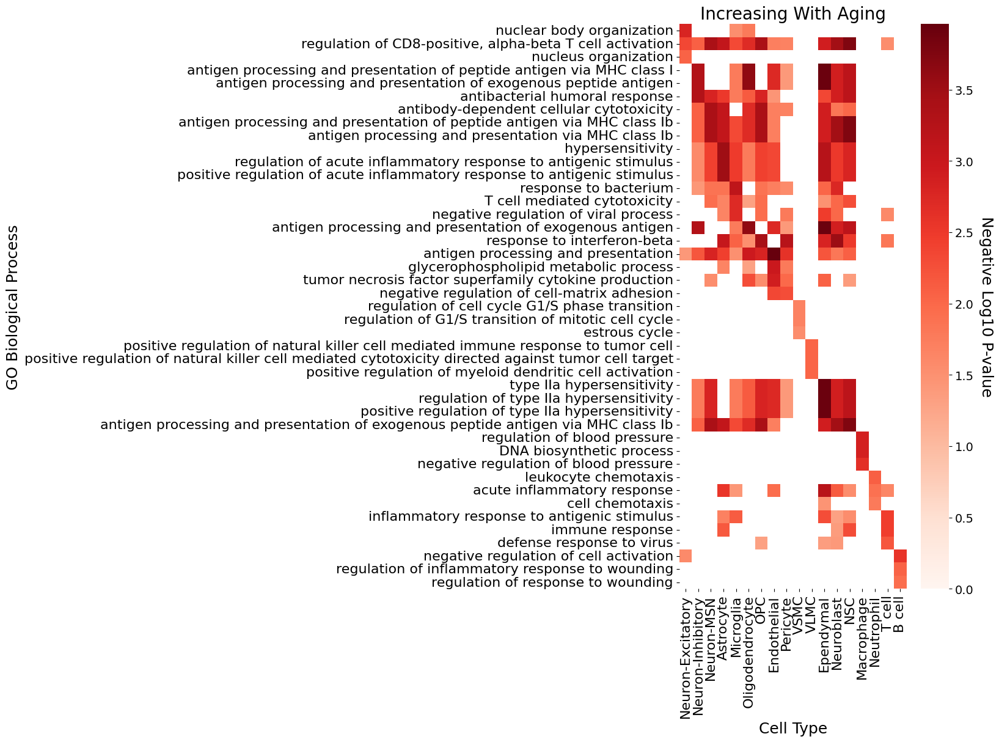

In [5]:
# Increasing only

sub_top_df = top_df[top_df["coef"]=="increasing"]
sub_df = df[df["coef"]=="increasing"]

#-----------------------------------------

# subset only top terms
top_terms = sub_top_df["Term"].values
sub_df = sub_df[sub_df["Term"].isin(top_terms)]
sub_df["Term"] = sub_df["Term"].astype('category').cat.reorder_categories(pd.unique(top_terms))

pivot_df = sub_df.pivot("Term", "celltype", "neglog10Fisher")


# PLOT

fig, ax = plt.subplots(figsize=(6,12))

# make colored heatmap
sns.heatmap(pivot_df, ax=ax, square=False, cmap="Reds", vmin=0)

ax.collections[0].colorbar.set_label('Negative Log10 P-value',
                                    rotation=270, fontsize=18, labelpad=23)
ax.collections[0].colorbar.ax.tick_params(labelsize=14)

plt.title("Increasing With Aging", fontsize=20)
plt.ylabel("GO Biological Process", fontsize=18)
plt.xlabel("Cell Type", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig("plots/pathways/increasing_genes.pdf",
          bbox_inches='tight')
plt.show()

/local/scratch/edsun/slrmtmp.43239619/ipykernel_19232/2725334727.py:13: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivot_df = sub_df.pivot("Term", "celltype", "neglog10Fisher")
/local/scratch/edsun/slrmtmp.43239619/ipykernel_19232/2725334727.py:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


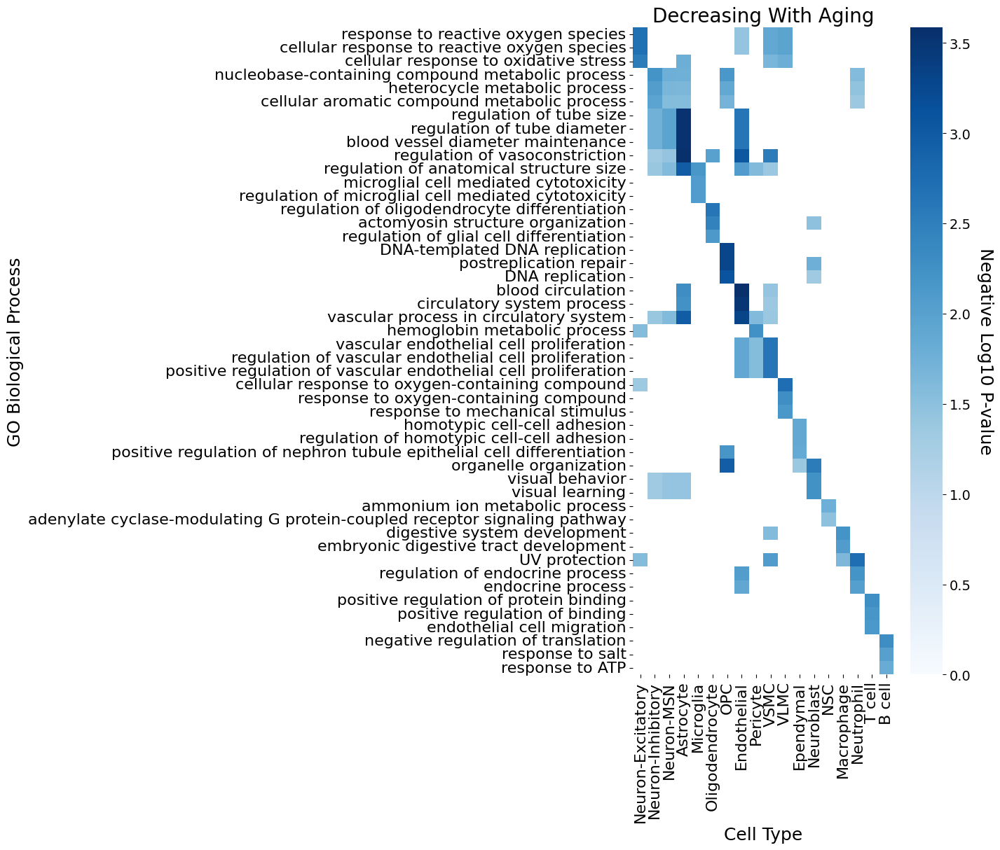

In [6]:
# Decreasing only

sub_top_df = top_df[top_df["coef"]=="decreasing"]
sub_df = df[df["coef"]=="decreasing"]

#-----------------------------------------

# subset only top terms
top_terms = sub_top_df["Term"].values
sub_df = sub_df[sub_df["Term"].isin(top_terms)]
sub_df["Term"] = sub_df["Term"].astype('category').cat.reorder_categories(pd.unique(top_terms))

pivot_df = sub_df.pivot("Term", "celltype", "neglog10Fisher")


# PLOT

fig, ax = plt.subplots(figsize=(6,12))

# make colored heatmap
sns.heatmap(pivot_df, ax=ax, square=False, cmap="Blues", vmin=0)

ax.collections[0].colorbar.set_label('Negative Log10 P-value',
                                    rotation=270, fontsize=18, labelpad=23)
ax.collections[0].colorbar.ax.tick_params(labelsize=14)

plt.title("Decreasing With Aging", fontsize=20)
plt.ylabel("GO Biological Process", fontsize=18)
plt.xlabel("Cell Type", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig("plots/pathways/decreasing_genes.pdf",
          bbox_inches='tight')
plt.show()

### Top increasing/decreasing gene by cell type

In [11]:
# load results
with open('results/dgea/celltype_dgea_spearman_combinedbulked.pkl', 'rb') as handle:
    dgea_dict = pickle.load(handle)
    
# list of genes to exclude (based on segmentation)
# >5% misallocation by Vizgen internal metric
exclude_markers = ['Gfap', 'Crym', 'Drd2', 'Nr4a2', 'Ighm', 'Slc17a7', 'Aldoc', 'Adora2a', 'Cd4', 'C1ql3', 'Stmn2', 'Pvalb', 'Thbs4', 'Gja1', 'Atp1a2', 'C4b', 'Drd1', 'Lamp5', 'Slc1a2', 'Sparc', 'Map1lc3a', 'Tox', 'Penk', 'Gad2', 'Chat', 'Apoe', 'Aqp4', 'Sulf2', 'Sox9', 'Clu', 'Tubb3', 'Slc32a1', 'Aldh1l1', 'Spock2', 'Nfic', 'Olig1', 'Flt1', 'Pbx3', 'Pdgfra', 'Adamts3', 'Tac1', 'Cdh2', 'Slc1a3', 'Agpat3', 'Fgfr3', 'Msmo1', 'Ntm', 'Efnb2', 'Apod', 'Cd47', 'Gad1', 'Cdk5r1', 'Cfl1', 'Jak1', 'Sst', 'Sox2', 'Dpp6', 'Stub1', 'Igf2', 'Elovl5', 'Fads2', 'Trim2', 'Syt11', 'C1qa', 'Npy', 'Htt', 'Pcsk1n', 'Akt1', 'Csf1r', 'Igf1r', 'Sox11', 'Slc17a6', 'Mtor', 'C1qb', 'Sod2', 'Btg2', 'Gpm6b', 'Vcam1', 'Nr2e1', 'Parp1']


# deleted excluded genes from dict
for key in dgea_dict.keys():
    del_idxs = pd.Series(dgea_dict[key]['gene']).isin(exclude_markers).values
    for key2 in dgea_dict[key].keys():
        cparr = np.array(dgea_dict[key][key2])[~del_idxs]
        dgea_dict[key][key2] = list(cparr)

In [12]:
# make deg frequency plot

celltypes = list(dgea_dict.keys())

increasing = []
decreasing = []

for celltype in celltypes:
    
    # get stats
    coefs = np.array(dgea_dict[celltype]['spearman'])
    increasing.append(dgea_dict[celltype]['gene'][np.argmax(coefs)])
    decreasing.append(dgea_dict[celltype]['gene'][np.argmin(coefs)])


df = pd.DataFrame([])
df['celltype'] = celltypes
df['most increasing'] = increasing
df['most decreasing'] = decreasing
df

,celltype,most increasing,most decreasing
0,Astrocyte,Cd274,Apln
1,B cell,Slc6a13,Prom1
2,Endothelial,Thbs1,Pomc
3,Ependymal,C3,Rarres2
4,Macrophage,Pmch,Cxcr3
5,Microglia,Pdcd1,Fcrls
6,NSC,H2-K1,Ptges3
7,Neuroblast,Ifit1,Top2a
8,Neuron-Excitatory,Pisd,Cat
9,Neuron-Inhibitory,Ifit1,Nts


## Visualization of spatial expression patterns

In [3]:
adata = sc.read_h5ad("data/integrated_aging_coronal_celltyped_regioned.h5ad")

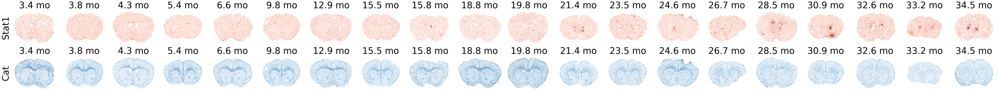

In [4]:
genes_to_profile = ["Stat1", "Cat"]
color_key = {"Stat1": "Reds", "Cat": "Blues"}

ages_to_profile = np.unique(adata.obs.age)

############################

### make plot
nrows = len(genes_to_profile)
ncols = len(ages_to_profile)

fig, axs = plt.subplots(nrows, ncols, figsize=(75,7), sharex=True, sharey=True)

for j in range(ncols):
    
    age = np.unique(adata.obs.age)[j] # get age
    
    for i in range(nrows):
        
        gene = genes_to_profile[i] # get cell type
        vmax = np.quantile(adata[:,gene].X, 0.99)
        
        # subset
        sub_adata = adata[adata.obs['age']==age]

        # make spatial plots
        axs[i,j].scatter(sub_adata.obsm["spatial"][:,0],
                     sub_adata.obsm["spatial"][:,1],
                     c=np.array(sub_adata[:,gene].X).flatten(), cmap=color_key[gene],
                     vmin=0, vmax=vmax,
                     s=0.5, rasterized=True)
        axs[i,j].set_title(str(age)+" mo",fontsize=48)
        
        # turn off all axis elements except for label
        # make xaxis invisibel
        axs[i,j].xaxis.set_visible(False)
        # make spines (the box) invisible
        plt.setp(axs[i,j].spines.values(), visible=False)
        # remove ticks and labels for the left axis
        axs[i,j].tick_params(left=False, labelleft=False)
        #remove background patch (only needed for non-white background)
        axs[i,j].patch.set_visible(False)

# set ylabel for first column
for ax, row in zip(axs[:,0], genes_to_profile):
    ax.set_ylabel(row, rotation=90, fontsize=48)
        
# make figure
plt.tight_layout()
plt.savefig("plots/dgea/spatial_age_gene_expression_Stat1Cat.pdf",bbox_inches='tight',dpi=300)
plt.show()

In [ ]:
genes_to_profile = ["Stat1","S100a6","Gfap","Mki67","Egfr","Dcx"]

ages_to_profile = np.unique(adata.obs.age)

############################
for gene in genes_to_profile:
    
    ### make plot
    nrows = 1
    ncols = len(ages_to_profile)

    fig, axs = plt.subplots(nrows, ncols, figsize=(75,3.5), sharex=True, sharey=True)

    for j in range(ncols):

        age = ages_to_profile[j] # get age

        vmax = np.quantile(adata[:,gene].X, 0.99)

        # subset
        sub_adata = adata[adata.obs['age']==age]

        # make spatial plots
        axs[j].scatter(sub_adata.obsm["spatial"][:,0],
                     sub_adata.obsm["spatial"][:,1],
                     c=np.array(sub_adata[:,gene].X).flatten(), cmap="Greens",
                     vmin=0, vmax=vmax,
                     s=0.5, rasterized=True)
        axs[j].set_title(str(age)+" mo",fontsize=48)

        # turn off all axis elements except for label
        # make xaxis invisibel
        axs[j].xaxis.set_visible(False)
        # make spines (the box) invisible
        plt.setp(axs[j].spines.values(), visible=False)
        # remove ticks and labels for the left axis
        axs[j].tick_params(left=False, labelleft=False)
        #remove background patch (only needed for non-white background)
        axs[j].patch.set_visible(False)

    # set ylabel for first column
    for ax, row in zip(axs, [gene]):
        ax.set_ylabel(row, rotation=90, fontsize=48)

    # make figure
    plt.tight_layout()
    plt.savefig(f"plots/dgea/spatial_age_gene_expression_{gene}.pdf",bbox_inches='tight',dpi=300)
    plt.close()

In [19]:
# Key 3 ages for IHC comparison

genes_to_profile = ["Stat1","S100a6","Gfap","Mki67","Egfr","Dcx"]

ages_to_profile = [3.4, 15.8, 28.5]

############################
for gene in genes_to_profile:
    
    ### make plot
    nrows = 1
    ncols = len(ages_to_profile)

    fig, axs = plt.subplots(nrows, ncols, figsize=(14,3.5), sharex=True, sharey=True)

    for j in range(ncols):

        age = ages_to_profile[j] # get age

        vmax = np.quantile(adata[:,gene].X, 0.99)

        # subset
        sub_adata = adata[adata.obs['age']==age]

        # make spatial plots
        axs[j].scatter(sub_adata.obsm["spatial"][:,0],
                     sub_adata.obsm["spatial"][:,1],
                     c=np.array(sub_adata[:,gene].X).flatten(), cmap="Greens",
                     vmin=0, vmax=vmax,
                     s=0.5, rasterized=True)
        axs[j].set_title(str(age)+" mo",fontsize=18)

        # turn off all axis elements except for label
        # make xaxis invisibel
        axs[j].xaxis.set_visible(False)
        # make spines (the box) invisible
        plt.setp(axs[j].spines.values(), visible=False)
        # remove ticks and labels for the left axis
        axs[j].tick_params(left=False, labelleft=False)
        #remove background patch (only needed for non-white background)
        axs[j].patch.set_visible(False)

    # set ylabel for first column
    for ax, row in zip(axs, [gene]):
        ax.set_ylabel(row, rotation=90, fontsize=18)

    # make figure
    plt.tight_layout()
    plt.savefig(f"plots/dgea/spatial_age_gene_expression_{gene}_3ages.pdf",bbox_inches='tight',dpi=300)
    plt.close()

In [21]:
# Key 3 ages for IHC comparison (VEN cropped)

genes_to_profile = ["Mki67","Egfr","Dcx"]

ages_to_profile = [3.4, 15.8, 28.5]

############################
for gene in genes_to_profile:
    
    ### make plot
    nrows = 1
    ncols = len(ages_to_profile)

    fig, axs = plt.subplots(nrows, ncols, figsize=(14,2.75), sharex=True, sharey=True)

    for j in range(ncols):

        age = ages_to_profile[j] # get age

        vmax = np.quantile(adata[:,gene].X, 0.99)

        # subset
        sub_adata = adata[adata.obs['age']==age]
        
        # crop
        sub_adata = sub_adata[(sub_adata.obsm['spatial'][:,0]<1700)&(sub_adata.obsm['spatial'][:,0]>-1700)&(sub_adata.obsm['spatial'][:,1]<1200)&(sub_adata.obsm['spatial'][:,1]>-1000)]

        # make spatial plots
        axs[j].scatter(sub_adata.obsm["spatial"][:,0],
                     sub_adata.obsm["spatial"][:,1],
                     c=np.array(sub_adata[:,gene].X).flatten(), cmap="Greens",
                     vmin=0, vmax=vmax,
                     s=0.5, rasterized=True)
        axs[j].set_title(str(age)+" mo",fontsize=18)

        # turn off all axis elements except for label
        # make xaxis invisibel
        axs[j].xaxis.set_visible(False)
        # make spines (the box) invisible
        plt.setp(axs[j].spines.values(), visible=False)
        # remove ticks and labels for the left axis
        axs[j].tick_params(left=False, labelleft=False)
        #remove background patch (only needed for non-white background)
        axs[j].patch.set_visible(False)

    # set ylabel for first column
    for ax, row in zip(axs, [gene]):
        ax.set_ylabel(row, rotation=90, fontsize=18)

    # make figure
    plt.tight_layout()
    plt.savefig(f"plots/dgea/spatial_age_gene_expression_{gene}_3ages_cropped.pdf",bbox_inches='tight',dpi=300)
    plt.close()

### Sagittal sections

In [3]:
adata = sc.read_h5ad("data/integrated_aging_sagittal_clustered_registered_raw.h5ad")
adata = normalize_adata(adata)

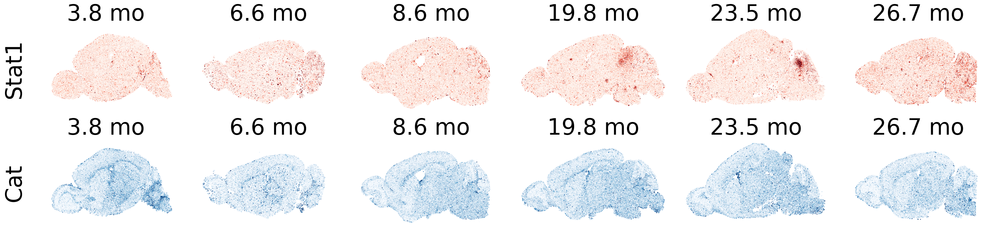

In [4]:
genes_to_profile = ["Stat1", "Cat"]
color_key = {"Stat1": "Reds", "Cat": "Blues"}

ages_to_profile = np.unique(adata.obs.age)

############################

### make plot
nrows = len(genes_to_profile)
ncols = len(ages_to_profile)

fig, axs = plt.subplots(nrows, ncols, figsize=(30,7), sharex=True, sharey=True)

for j in range(ncols):
    
    age = np.unique(adata.obs.age)[j] # get age
    
    for i in range(nrows):
        
        gene = genes_to_profile[i] # get cell type
        vmax = np.quantile(adata[:,gene].X, 0.99)
        
        # subset
        sub_adata = adata[adata.obs['age']==age]

        # make spatial plots
        axs[i,j].scatter(sub_adata.obsm["spatial"][:,0],
                     sub_adata.obsm["spatial"][:,1],
                     c=np.array(sub_adata[:,gene].X).flatten(), cmap=color_key[gene],
                     vmin=0, vmax=vmax,
                     s=0.5, rasterized=True)
        axs[i,j].set_title(str(age)+" mo",fontsize=48)
        
        # turn off all axis elements except for label
        # make xaxis invisibel
        axs[i,j].xaxis.set_visible(False)
        # make spines (the box) invisible
        plt.setp(axs[i,j].spines.values(), visible=False)
        # remove ticks and labels for the left axis
        axs[i,j].tick_params(left=False, labelleft=False)
        #remove background patch (only needed for non-white background)
        axs[i,j].patch.set_visible(False)

# set ylabel for first column
for ax, row in zip(axs[:,0], genes_to_profile):
    ax.set_ylabel(row, rotation=90, fontsize=48)
        
# make figure
plt.tight_layout()
plt.savefig("plots/dgea/spatial_age_gene_expression_sagittal_Stat1_Cat.pdf",bbox_inches='tight',dpi=300)
plt.show()

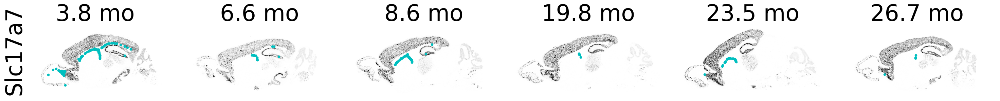

In [22]:
# overlay NSC onto Slc17a7 plot

gene = "Slc17a7"

ages_to_profile = np.unique(adata.obs.age)

############################

### make plot
ncols = len(ages_to_profile)

fig, axs = plt.subplots(1, ncols, figsize=(30,3.1), sharex=True, sharey=True)

for j in range(ncols):
    
    age = np.unique(adata.obs.age)[j] # get age
    
    # plot gene
    vmax = np.quantile(adata[:,gene].X, 0.99)

    # subset
    sub_adata = adata[adata.obs['age']==age]

    # make spatial plots
    axs[j].scatter(sub_adata.obsm["spatial"][:,0],
                 sub_adata.obsm["spatial"][:,1],
                 c=np.array(sub_adata[:,gene].X).flatten(), cmap="Greys",
                 vmin=0, vmax=vmax,
                 s=0.5, rasterized=True)
    axs[j].set_title(str(age)+" mo",fontsize=48)
    
    
    # plot cell type
    sub_adata_nsc = sub_adata[sub_adata.obs.celltype=="NSC"]
    axs[j].scatter(sub_adata_nsc.obsm["spatial"][:,0],
                 sub_adata_nsc.obsm["spatial"][:,1],
                 c="c",
                 s=20, rasterized=True)
    
    # turn off all axis elements except for label
    # make xaxis invisibel
    axs[j].xaxis.set_visible(False)
    # make spines (the box) invisible
    plt.setp(axs[j].spines.values(), visible=False)
    # remove ticks and labels for the left axis
    axs[j].tick_params(left=False, labelleft=False)
    #remove background patch (only needed for non-white background)
    axs[j].patch.set_visible(False)

# set ylabel for first column
fig.supylabel(gene, rotation=90, fontsize=48)
        
# make figure
plt.tight_layout()
plt.savefig("plots/dgea/spatial_age_gene_expression_sagittal_Slc17a7_NSC.pdf",bbox_inches='tight',dpi=300)
plt.show()

## Cell type x Gene heatmap

In [ ]:
# read data and normalize
adata = sc.read_h5ad("data/integrated_aging_coronal_celltyped_regioned_raw.h5ad")
adata = adata[(adata.obs.clusters!="1")&(adata.obs.mouse_id!="89")&(adata.obs.mouse_id!="67")].copy()

adata = normalize_adata (adata, zscore=False)

In [ ]:
# subset genes (get subset with largest changes)

df = pd.read_csv("results/dgea/celltype_dgea_spearman_combinedbulked.csv", index_col=0)
df = df[[col for col in df.columns if "_Spearman" in col]]

# take 20 most variable genes
filtered_df = df.iloc[np.std(df, axis=1).argsort()[::-1][:20]]

# sort genes by their mean spearman
sorted_df = filtered_df.iloc[np.mean(filtered_df, axis=1).argsort()]
highly_variable_genes = sorted_df.index.values

In [ ]:
# gene by age dataframe

def get_gene_by_age (adata):
    
    age_mean_expns = []
    
    ages = np.unique(adata.obs.age)
    
    for age in ages:
        mean_expn = np.mean(adata[adata.obs.age==age].X, axis=0)
        age_mean_expns.append(mean_expn)
        
    # compute z-score across age (like for trajectories)
    from sklearn.preprocessing import StandardScaler
    age_expn_matrix = StandardScaler().fit_transform(np.vstack(age_mean_expns))
    age_expn_matrix = age_expn_matrix.T
    
    # smooth (same as trajectory)
    from scipy.interpolate import splrep, BSpline
    for i in range(age_expn_matrix.shape[0]):
        smoother = BSpline(*splrep(ages, age_expn_matrix[i,:], s=len(ages)))
        age_expn_matrix[i,:] = smoother(ages)
    
    df = pd.DataFrame(age_expn_matrix, columns=ages, index=adata.var_names)
    
    return (df)

In [ ]:
# heatmap plot transposed (stacked)
celltypes = np.unique(adata.obs.celltype)

for ct in celltypes:
    
    plot_df = get_gene_by_age(adata[adata.obs.celltype==ct][:,highly_variable_genes])
    
    fig, ax = plt.subplots(figsize=(4,4)) # for 20 genes half width
    g = sns.heatmap(plot_df, ax=ax,
                vmin=-np.max(np.abs(plot_df.values.flatten())),
                vmax=np.max(np.abs(plot_df.values.flatten())),
                cmap="vlag",  xticklabels=True, yticklabels=True)
    g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 10)
    g.set_xticklabels([])
    g.collections[0].colorbar.ax.tick_params(labelsize=14)
    plt.xlabel("Age (Months)", fontsize=16)
    plt.ylabel("Gene", fontsize=16)
    plt.title(ct, fontsize=18)
    plt.tight_layout()
    plt.savefig(f"plots/dgea/heatmap_age_expressionAgeZscore_{ct}.pdf",
              bbox_inches='tight')
    plt.show()

# Differentially expressed genes under rejuvenation

The following section contains differential gene expression analysis between conditions of the exercise and partial reprogramming cohorts and comparisons of age-related and intervention-related differential gene expression in those respective datasets.

# Exercise

Note: FoldChange is computed by transforming log1p back to np.exp(x)-1

In [9]:
adata = sc.read_h5ad("data/integrated_exercise_coronal_celltyped_regioned_raw.h5ad")
adata = normalize_adata(adata, zscore=False)

In [11]:
dgea_dict = {}

for celltype in np.unique(adata.obs.celltype):
    
    print(celltype)
    
    # subset cell type
    sub_adata = adata[adata.obs.celltype==celltype]
    
    # init dict
    dgea_dict[celltype] = {}
    dgea_dict[celltype]["gene"] = []
    dgea_dict[celltype]["p-value_OCYC"] = []
    dgea_dict[celltype]["foldchange_OCYC"] = []
    dgea_dict[celltype]["p-value_OCOE"] = []
    dgea_dict[celltype]["foldchange_OCOE"] = []

    for gene in sub_adata.var_names:
        
        # Old vs Young
        p_ocyc = float(mannwhitneyu(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X,
                              sub_adata[sub_adata.obs["cohort"]=="young_control",gene].X)[1])
        fc_ocyc = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="young_control",gene].X)-1))
        
        # Old Control vs Old Exercise
        p_ocoe = float(mannwhitneyu(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X,
                              sub_adata[sub_adata.obs["cohort"]=="old_exercise",gene].X)[1])
        fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_exercise",gene].X)-1))
        
        # get results
        dgea_dict[celltype]["gene"].append(gene)
        dgea_dict[celltype]["p-value_OCYC"].append(p_ocyc) # first is intercept
        dgea_dict[celltype]["foldchange_OCYC"].append(fc_ocyc)
        dgea_dict[celltype]["p-value_OCOE"].append(p_ocoe)
        dgea_dict[celltype]["foldchange_OCOE"].append(fc_ocoe)

Astrocyte
Endothelial


/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/3840690099.py:28: RuntimeWarning: divide by zero encountered in true_divide
  fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_exercise",gene].X)-1))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/3840690099.py:28: RuntimeWarning: invalid value encountered in true_divide
  fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_exercise",gene].X)-1))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/3840690099.py:23: RuntimeWarning: divide by zero encountered in true_divide
  fc_ocyc = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="young_control",gene].X)-1))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/3840690099.py:23: RuntimeWarni

Ependymal
Macrophage
Microglia
NSC
Neuroblast
Neuron-Excitatory


/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/3840690099.py:23: RuntimeWarning: Mean of empty slice
  fc_ocyc = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="young_control",gene].X)-1))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/3840690099.py:28: RuntimeWarning: Mean of empty slice
  fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_control",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_exercise",gene].X)-1))


Neuron-Inhibitory
Neuron-MSN
Neutrophil
OPC
Oligodendrocyte
Pericyte
T cell
VLMC
VSMC


In [12]:
with open('results/dgea/celltype_dgea_exercise_mannwhitneyu_fc.pkl', 'wb') as handle:
    pickle.dump(dgea_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [6]:
with open('results/dgea/celltype_dgea_exercise_mannwhitneyu_fc.pkl', 'rb') as handle:
    dgea_dict = pickle.load(handle)

In [13]:
# save results as CSV
for ki, key in enumerate(dgea_dict.keys()):
    
    key_df = pd.DataFrame([])
    key_df["gene"] = dgea_dict[key]['gene']
    key_df[f"{key}_PValue_Aging"] = dgea_dict[key]['p-value_OCYC']
    key_df[f"{key}_FoldChange_Aging"] = dgea_dict[key]['foldchange_OCYC']
    key_df[f"{key}_PValue_Exercise"] = dgea_dict[key]['p-value_OCOE']
    key_df[f"{key}_FoldChange_Exercise"] = 1/np.array(dgea_dict[key]['foldchange_OCOE']) # inverse to get Exercise/Control
    
    if ki == 0:
        combined_df = key_df
    else:
        combined_df = pd.merge(combined_df,key_df,on="gene")
    
combined_df.to_csv("results/dgea/celltype_dgea_exercise_mannwhitneyu_fc.csv", index=False)

/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/1379982078.py:9: RuntimeWarning: divide by zero encountered in true_divide
  key_df[f"{key}_FoldChange_Exercise"] = 1/np.array(dgea_dict[key]['foldchange_OCOE']) # inverse to get Exercise/Control
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/1379982078.py:9: RuntimeWarning: divide by zero encountered in true_divide
  key_df[f"{key}_FoldChange_Exercise"] = 1/np.array(dgea_dict[key]['foldchange_OCOE']) # inverse to get Exercise/Control
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/1379982078.py:9: RuntimeWarning: divide by zero encountered in true_divide
  key_df[f"{key}_FoldChange_Exercise"] = 1/np.array(dgea_dict[key]['foldchange_OCOE']) # inverse to get Exercise/Control
/local/scratch/edsun/slrmtmp.43007770/ipykernel_666/1379982078.py:9: RuntimeWarning: divide by zero encountered in true_divide
  key_df[f"{key}_FoldChange_Exercise"] = 1/np.array(dgea_dict[key]['foldchange_OCOE']) # inverse to get Exercise/Control
/local/s

### Similarities and differences in DEGs between Exercise and Aging

In [9]:
with open('results/dgea/celltype_dgea_exercise_mannwhitneyu_fc.pkl', 'rb') as handle:
    dgea_dict = pickle.load(handle)

In [10]:
intersection_dict = {}



for celltype in dgea_dict.keys():
    
    intersection_dict[celltype] = {}

    intersection_dict[celltype]['up_age_down_exercise'] = {}
    intersection_dict[celltype]['up_age_down_exercise']["intersection"] = []
    intersection_dict[celltype]['up_age_down_exercise']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['up_age_down_exercise']['set_sizes'] = [0,0]
    
    intersection_dict[celltype]['down_age_down_exercise'] = {}
    intersection_dict[celltype]['down_age_down_exercise']["intersection"] = []
    intersection_dict[celltype]['down_age_down_exercise']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['down_age_down_exercise']['set_sizes'] = [0,0]
    
    intersection_dict[celltype]['up_age_up_exercise'] = {}
    intersection_dict[celltype]['up_age_up_exercise']["intersection"] = []
    intersection_dict[celltype]['up_age_up_exercise']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['up_age_up_exercise']['set_sizes'] = [0,0]
    
    intersection_dict[celltype]['down_age_up_exercise'] = {}
    intersection_dict[celltype]['down_age_up_exercise']["intersection"] = []
    intersection_dict[celltype]['down_age_up_exercise']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['down_age_up_exercise']['set_sizes'] = [0,0]
    
    
    # AGING
    
    # FDR correction
    ocyc_rejected, correct_p, alpha_s, alpha_b = multipletests(dgea_dict[celltype]['p-value_OCYC'], alpha=0.05, method='fdr_bh')

    # get stats
    ocyc_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCYC'])
    ocyc_coefs = np.log2(dgea_dict[celltype]['foldchange_OCYC'])
    
    ocyc_degs_up_with_age = np.array(dgea_dict[celltype]['gene'])[ocyc_rejected & (ocyc_coefs > 0.1)]
    ocyc_degs_down_with_age = np.array(dgea_dict[celltype]['gene'])[ocyc_rejected & (ocyc_coefs < -0.1)]
    
    
    # EXERCISE
    
    # FDR correction
    ocoe_rejected, correct_p, alpha_s, alpha_b = multipletests(dgea_dict[celltype]['p-value_OCOE'], alpha=0.05, method='fdr_bh')

    # get stats
    ocoe_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCOE'])
    ocoe_coefs = np.log2(dgea_dict[celltype]['foldchange_OCOE'])
    
    # NOTE: This is swapped in direction since we defined OC vs OE
    ocoe_degs_up_with_exercise = np.array(dgea_dict[celltype]['gene'])[ocoe_rejected & (ocoe_coefs < -0.1)]
    ocoe_degs_down_with_exercise = np.array(dgea_dict[celltype]['gene'])[ocoe_rejected & (ocoe_coefs > 0.1)]
    
    
    # Find intersections
    
    # up_age_down_exercise
    a = ocyc_degs_up_with_age
    b = ocoe_degs_down_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['up_age_down_exercise']["intersection"] = intersection
        intersection_dict[celltype]['up_age_down_exercise']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['up_age_down_exercise']['set_sizes'] = [len(a),len(b)]
    
    # down_age_down_exercise
    a = ocyc_degs_down_with_age
    b = ocoe_degs_down_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['down_age_down_exercise']["intersection"] = intersection
        intersection_dict[celltype]['down_age_down_exercise']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['down_age_down_exercise']['set_sizes'] = [len(a),len(b)]
    
    # up_age_up_exercise
    a = ocyc_degs_up_with_age
    b = ocoe_degs_up_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['up_age_up_exercise']["intersection"] = intersection
        intersection_dict[celltype]['up_age_up_exercise']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['up_age_up_exercise']['set_sizes'] = [len(a),len(b)]
    
    # down_age_up_exercise
    a = ocyc_degs_down_with_age
    b = ocoe_degs_up_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['down_age_up_exercise']["intersection"] = intersection
        intersection_dict[celltype]['down_age_up_exercise']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['down_age_up_exercise']['set_sizes'] = [len(a),len(b)]

/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/2864097324.py:36: RuntimeWarning: divide by zero encountered in log10
  ocyc_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCYC'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/2864097324.py:37: RuntimeWarning: divide by zero encountered in log2
  ocyc_coefs = np.log2(dgea_dict[celltype]['foldchange_OCYC'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/2864097324.py:50: RuntimeWarning: divide by zero encountered in log2
  ocoe_coefs = np.log2(dgea_dict[celltype]['foldchange_OCOE'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/2864097324.py:49: RuntimeWarning: divide by zero encountered in log10
  ocoe_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCOE'])


In [11]:
keys_all = []
keys_sig = []
celltypes_sig = []

for celltype in intersection_dict.keys():
    for key in intersection_dict[celltype].keys():
        keys_all.append(key)
        if (intersection_dict[celltype][key]["hypergeom_pvalue"] < 0.05) and (~np.isnan(intersection_dict[celltype][key]["hypergeom_pvalue"])):
            keys_sig.append(key)
            celltypes_sig.append(celltype)
            print(celltype+" + "+key)
            print(intersection_dict[celltype][key]["intersection"])
            print("\n")

Astrocyte + down_age_up_exercise
['Ccl5' 'Ccr4' 'Cdkn2a' 'Chat' 'Crym' 'Egfr' 'Igf1' 'Igf1r' 'Lars2' 'Nts'
 'Olig1' 'Olig2' 'S100a9' 'Slc17a6' 'Sox11' 'Sparc' 'Syt11' 'Vtn']


Endothelial + up_age_down_exercise
['Apod' 'B2m' 'C4b' 'Cd28' 'Cdk1' 'Enpp2' 'Fos' 'Ighm' 'Il2ra' 'Klk6'
 'Mat2a' 'Mmp12' 'Nr2e1' 'Pf4' 'Pik3r1' 'Pisd' 'Pvalb' 'Rbm39' 'Sirt1'
 'Slc17a7' 'Socs3' 'Sox9' 'Stat3' 'Surf1' 'Tcf7' 'Vegfa']


Endothelial + down_age_up_exercise
['Ccr4' 'Cd8b1' 'Cdkn1a' 'Cdkn2a' 'Cldn5' 'Efnb2' 'Itga4' 'Jun' 'Klrk1'
 'Lars2' 'Mcm2' 'Npy' 'Nts' 'Olig2' 'Sox11' 'Sparc' 'Trp53']


Ependymal + up_age_down_exercise
['Atp1a2' 'Cd79a' 'Enpp2' 'Fcgr3' 'Fcrls' 'Fos' 'Gfap' 'Il1a' 'Neat1'
 'Penk' 'S100a6']


Ependymal + down_age_up_exercise
['Acta2' 'Agpat3' 'Aqp4' 'Cd24a' 'Cd9' 'Cdk5r1' 'Cdkn1a' 'Clu' 'Cnn3'
 'Dcx' 'Elovl5' 'Ifngr1' 'Itgb1' 'Lars2' 'Mtor' 'Pcsk1n' 'Pdpn' 'Ptges3'
 'Rarres2' 'Slc2a1' 'Sox2' 'Sparc' 'Srebf1' 'Sulf2' 'Tmem212']


Macrophage + up_age_down_exercise
['Gfap' 'Vcam1']


M

In [12]:
np.unique(keys_all, return_counts=True)

(array(['down_age_down_exercise', 'down_age_up_exercise',
        'up_age_down_exercise', 'up_age_up_exercise'], dtype='<U22'),
 array([18, 18, 18, 18]))

In [13]:
np.unique(keys_sig, return_counts=True)

(array(['down_age_up_exercise', 'up_age_down_exercise'], dtype='<U20'),
 array([13,  9]))

## Find most common aging reversal genes by exercise

In [19]:
# assemble dataframe containing all genes that are in age-exercise groups with significant overlap

celltypes_col = []
genes_col = []
group_col = []

for celltype in intersection_dict.keys():
    for key in intersection_dict[celltype].keys():
        if (intersection_dict[celltype][key]["hypergeom_pvalue"] < 0.05) and (~np.isnan(intersection_dict[celltype][key]["hypergeom_pvalue"])):
            celltypes_col += [celltype]*len(intersection_dict[celltype][key]["intersection"])
            genes_col += list(intersection_dict[celltype][key]["intersection"])
            group_col += [key]*len(intersection_dict[celltype][key]["intersection"])
            
df = pd.DataFrame(np.array(celltypes_col).T, columns=['celltype'])
df['gene'] = genes_col
df['group'] = group_col

In [20]:
# up_age_down_exercise

df_uade = pd.DataFrame(np.unique(df[df['group']=='up_age_down_exercise']['gene'], return_counts=True)).T
df_uade.columns = ['gene','count']
df_uade[df_uade["count"]>=3].sort_values('count', ascending=False)

up_age_down_exercise_genes = []

In [21]:
# down_age_up_exercise

df_uade = pd.DataFrame(np.unique(df[df['group']=='down_age_up_exercise']['gene'], return_counts=True)).T
df_uade.columns = ['gene','count']
df_uade[df_uade["count"]>=3].sort_values('count', ascending=False)

,gene,count
64,Lars2,9
113,Vtn,8
18,Cdkn1a,8
94,Sox11,7
96,Sparc,6
75,Nts,6
89,Slc17a6,5
80,Pcsk1n,5
77,Olig2,5
76,Olig1,5


## Plots of aging versus exercise DEGs

In [22]:
with open('results/dgea/celltype_dgea_exercise_mannwhitneyu_fc.pkl', 'rb') as handle:
    dgea_dict_exercise = pickle.load(handle)

In [23]:
overlap_keys = ['Neuron-Excitatory', 'Neuron-Inhibitory', 'Neuron-MSN',
                    'Astrocyte', 'Microglia', 'Oligodendrocyte', 'OPC',
                    'Endothelial', 'Pericyte', 'VSMC', 'VLMC',
                    'Ependymal', 'Neuroblast', 'NSC', 
                    'Macrophage', 'Neutrophil','T cell', 'B cell']

/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1996325099.py:13: RuntimeWarning: divide by zero encountered in log2
  aging_gene_log2fc = np.log2(dgea_dict_exercise[celltype]['foldchange_OCYC'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1996325099.py:14: RuntimeWarning: divide by zero encountered in true_divide
  exercise_gene_log2fc = np.log2(1/np.array(dgea_dict_exercise[celltype]['foldchange_OCOE']))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1996325099.py:14: RuntimeWarning: divide by zero encountered in log2
  exercise_gene_log2fc = np.log2(1/np.array(dgea_dict_exercise[celltype]['foldchange_OCOE']))


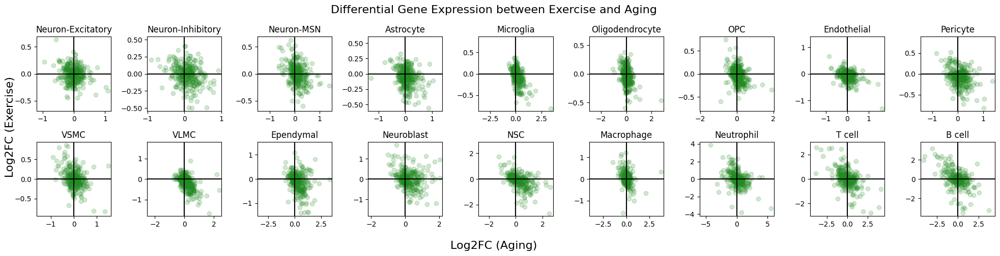

In [24]:
nrows = 2
ncols = 9

fig, axs = plt.subplots(2, 9, figsize=(20,5), sharex=False, sharey=False)

counter = 0
for i in range(nrows):
    for j in range(ncols):
        
        celltype = overlap_keys[counter]
        
        # get stats
        aging_gene_log2fc = np.log2(dgea_dict_exercise[celltype]['foldchange_OCYC'])
        exercise_gene_log2fc = np.log2(1/np.array(dgea_dict_exercise[celltype]['foldchange_OCOE']))
        
        axs[i,j].scatter(aging_gene_log2fc, exercise_gene_log2fc, c='forestgreen', alpha=0.2)
        axs[i,j].axvline(0, color='k')
        axs[i,j].axhline(0, color='k')
        axs[i,j].set_title(f'{celltype}')
        
        # set up symmetric rectangle
        ymin, ymax = axs[i,j].get_ylim()
        xmin, xmax = axs[i,j].get_xlim()
        axs[i,j].set_ylim(-np.max(np.abs([ymin,ymax])), np.max(np.abs([ymin,ymax])))
        axs[i,j].set_xlim(-np.max(np.abs([xmin,xmax])), np.max(np.abs([xmin,xmax])))
                
        counter += 1
        
fig.suptitle("Differential Gene Expression between Exercise and Aging", fontsize=16)
fig.supxlabel("Log2FC (Aging)", fontsize=16)
fig.supylabel("Log2FC (Exercise)", fontsize=16)
plt.tight_layout()
plt.savefig("plots/exercise/aging_vs_exercise_log2fc_exercisedataonly.pdf", bbox_inches='tight')
plt.show()

In [25]:
celltypes_down_age_up_exercise

array(['Astrocyte', 'Endothelial', 'Ependymal', 'Microglia', 'NSC',
       'Neuron-Excitatory', 'Neuron-Inhibitory', 'Neuron-MSN', 'OPC',
       'Oligodendrocyte', 'Pericyte', 'VLMC', 'VSMC'], dtype=object)

In [26]:
celltypes_up_age_down_exercise

array(['Endothelial', 'Ependymal', 'Macrophage', 'Microglia',
       'Neuron-Inhibitory', 'Neuron-MSN', 'OPC', 'Pericyte', 'T cell'],
      dtype=object)

# Partial Reprogramming
Note: FoldChange is computed by transforming log1p back to np.exp(x)-1

In [27]:
adata = sc.read_h5ad("data/integrated_reprogramming_coronal_celltyped_regioned_raw.h5ad")
adata = normalize_adata(adata, zscore=False)

In [28]:
dgea_dict = {}

for celltype in np.unique(adata.obs.celltype):
    
    print(celltype)
    
    # subset cell type
    sub_adata = adata[adata.obs.celltype==celltype]
    
    # init dict
    dgea_dict[celltype] = {}
    dgea_dict[celltype]["gene"] = []
    dgea_dict[celltype]["p-value_OCYC"] = []
    dgea_dict[celltype]["foldchange_OCYC"] = []
    dgea_dict[celltype]["p-value_OCOR"] = []
    dgea_dict[celltype]["foldchange_OCOR"] = []

    for gene in sub_adata.var_names:
        
        # Old vs Young
        p_ocyc = float(mannwhitneyu(sub_adata[sub_adata.obs["cohort"]=="old_notreatment",gene].X,
                              sub_adata[sub_adata.obs["cohort"]=="young_notreatment",gene].X)[1])
        fc_ocyc = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_notreatment",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="young_notreatment",gene].X)-1))
        
        # Old Control vs Old Exercise
        p_ocoe = float(mannwhitneyu(sub_adata[sub_adata.obs["cohort"]=="old_notreatment",gene].X,
                              sub_adata[sub_adata.obs["cohort"]=="old_treatment",gene].X)[1])
        fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_notreatment",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_treatment",gene].X)-1))
        
        # get results
        dgea_dict[celltype]["gene"].append(gene)
        dgea_dict[celltype]["p-value_OCYC"].append(p_ocyc) # first is intercept
        dgea_dict[celltype]["foldchange_OCYC"].append(fc_ocyc)
        dgea_dict[celltype]["p-value_OCOR"].append(p_ocoe)
        dgea_dict[celltype]["foldchange_OCOR"].append(fc_ocoe)

Astrocyte
Endothelial
Ependymal
Macrophage
Microglia
NSC
Neuroblast


/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1481010863.py:28: RuntimeWarning: divide by zero encountered in true_divide
  fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_notreatment",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_treatment",gene].X)-1))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1481010863.py:28: RuntimeWarning: invalid value encountered in true_divide
  fc_ocoe = float(np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_notreatment",gene].X)-1)/np.nanmean(np.exp(sub_adata[sub_adata.obs["cohort"]=="old_treatment",gene].X)-1))


Neuron-Excitatory
Neuron-Inhibitory
Neuron-MSN
OPC
Oligodendrocyte
Pericyte
VLMC
VSMC


In [29]:
with open('results/dgea/celltype_dgea_reprogramming_mannwhitneyu_fc.pkl', 'wb') as handle:
    pickle.dump(dgea_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [30]:
with open('results/dgea/celltype_dgea_reprogramming_mannwhitneyu_fc.pkl', 'rb') as handle:
    dgea_dict = pickle.load(handle)

In [31]:
# save results as CSV
for ki, key in enumerate(dgea_dict.keys()):
    
    key_df = pd.DataFrame([])
    key_df["gene"] = dgea_dict[key]['gene']
    key_df[f"{key}_PValue_Aging"] = dgea_dict[key]['p-value_OCYC']
    key_df[f"{key}_FoldChange_Aging"] = dgea_dict[key]['foldchange_OCYC']
    key_df[f"{key}_PValue_OSKM"] = dgea_dict[key]['p-value_OCOR']
    key_df[f"{key}_FoldChange_OSKM"] = 1/np.array(dgea_dict[key]['foldchange_OCOR']) # inverse to get OSKM/Control
    
    if ki == 0:
        combined_df = key_df
    else:
        combined_df = pd.merge(combined_df,key_df,on="gene")
    
combined_df.to_csv("results/dgea/celltype_dgea_reprogramming_mannwhitneyu_fc.csv", index=False)

/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/2906637083.py:9: RuntimeWarning: divide by zero encountered in true_divide
  key_df[f"{key}_FoldChange_OSKM"] = 1/np.array(dgea_dict[key]['foldchange_OCOR']) # inverse to get OSKM/Control
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/2906637083.py:9: RuntimeWarning: divide by zero encountered in true_divide
  key_df[f"{key}_FoldChange_OSKM"] = 1/np.array(dgea_dict[key]['foldchange_OCOR']) # inverse to get OSKM/Control


In [32]:
intersection_dict = {}



for celltype in dgea_dict.keys():
    
    intersection_dict[celltype] = {}

    intersection_dict[celltype]['up_age_down_reprogramming'] = {}
    intersection_dict[celltype]['up_age_down_reprogramming']["intersection"] = []
    intersection_dict[celltype]['up_age_down_reprogramming']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['up_age_down_reprogramming']['set_sizes'] = [0,0]
    
    intersection_dict[celltype]['down_age_down_reprogramming'] = {}
    intersection_dict[celltype]['down_age_down_reprogramming']["intersection"] = []
    intersection_dict[celltype]['down_age_down_reprogramming']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['down_age_down_reprogramming']['set_sizes'] = [0,0]
    
    intersection_dict[celltype]['up_age_up_reprogramming'] = {}
    intersection_dict[celltype]['up_age_up_reprogramming']["intersection"] = []
    intersection_dict[celltype]['up_age_up_reprogramming']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['up_age_up_reprogramming']['set_sizes'] = [0,0]
    
    intersection_dict[celltype]['down_age_up_reprogramming'] = {}
    intersection_dict[celltype]['down_age_up_reprogramming']["intersection"] = []
    intersection_dict[celltype]['down_age_up_reprogramming']['hypergeom_pvalue'] = np.nan
    intersection_dict[celltype]['down_age_up_reprogramming']['set_sizes'] = [0,0]
    
    
    # AGING
    
    # FDR correction
    ocyc_rejected, correct_p, alpha_s, alpha_b = multipletests(dgea_dict[celltype]['p-value_OCYC'], alpha=0.05, method='fdr_bh')

    # get stats
    ocyc_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCYC'])
    ocyc_coefs = np.log2(dgea_dict[celltype]['foldchange_OCYC'])
    
    ocyc_degs_up_with_age = np.array(dgea_dict[celltype]['gene'])[ocyc_rejected & (ocyc_coefs > 0.1)]
    ocyc_degs_down_with_age = np.array(dgea_dict[celltype]['gene'])[ocyc_rejected & (ocyc_coefs < -0.1)]
    
    
    # EXERCISE
    
    # FDR correction
    ocoe_rejected, correct_p, alpha_s, alpha_b = multipletests(dgea_dict[celltype]['p-value_OCOR'], alpha=0.05, method='fdr_bh')

    # get stats
    ocoe_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCOR'])
    ocoe_coefs = np.log2(dgea_dict[celltype]['foldchange_OCOR'])
    
    ocoe_degs_up_with_exercise = np.array(dgea_dict[celltype]['gene'])[ocoe_rejected & (ocoe_coefs < -0.1)]
    ocoe_degs_down_with_exercise = np.array(dgea_dict[celltype]['gene'])[ocoe_rejected & (ocoe_coefs > 0.1)]
    
    
    # Find intersections
    
    # up_age_down_exercise
    a = ocyc_degs_up_with_age
    b = ocoe_degs_down_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['up_age_down_reprogramming']["intersection"] = intersection
        intersection_dict[celltype]['up_age_down_reprogramming']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['up_age_down_reprogramming']['set_sizes'] = [len(a),len(b)]
    
    # down_age_down_exercise
    a = ocyc_degs_down_with_age
    b = ocoe_degs_down_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['down_age_down_reprogramming']["intersection"] = intersection
        intersection_dict[celltype]['down_age_down_reprogramming']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['down_age_down_reprogramming']['set_sizes'] = [len(a),len(b)]
    
    # up_age_up_exercise
    a = ocyc_degs_up_with_age
    b = ocoe_degs_up_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['up_age_up_reprogramming']["intersection"] = intersection
        intersection_dict[celltype]['up_age_up_reprogramming']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['up_age_up_reprogramming']['set_sizes'] = [len(a),len(b)]
    
    # down_age_up_exercise
    a = ocyc_degs_down_with_age
    b = ocoe_degs_up_with_exercise
    if (len(a)==0) or (len(b)==0):
        pass
    else:
        intersection = np.intersect1d(a, b)
        pvalue = 1-hypergeom.cdf(int(len(intersection))-1, int(len(dgea_dict[celltype]['gene'])),
                               int(len(a)), int(len(b)))
        intersection_dict[celltype]['down_age_up_reprogramming']["intersection"] = intersection
        intersection_dict[celltype]['down_age_up_reprogramming']['hypergeom_pvalue'] = pvalue
        intersection_dict[celltype]['down_age_up_reprogramming']['set_sizes'] = [len(a),len(b)]

/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1410985120.py:36: RuntimeWarning: divide by zero encountered in log10
  ocyc_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCYC'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1410985120.py:49: RuntimeWarning: divide by zero encountered in log10
  ocoe_neglog10_pvalue = -np.log10(dgea_dict[celltype]['p-value_OCOR'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1410985120.py:37: RuntimeWarning: divide by zero encountered in log2
  ocyc_coefs = np.log2(dgea_dict[celltype]['foldchange_OCYC'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/1410985120.py:50: RuntimeWarning: divide by zero encountered in log2
  ocoe_coefs = np.log2(dgea_dict[celltype]['foldchange_OCOR'])


In [33]:
keys_all = []
keys_sig = []
celltypes_sig = []

for celltype in intersection_dict.keys():
    for key in intersection_dict[celltype].keys():
        keys_all.append(key)
        if (intersection_dict[celltype][key]["hypergeom_pvalue"] < 0.05) and (~np.isnan(intersection_dict[celltype][key]["hypergeom_pvalue"])):
            keys_sig.append(key)
            celltypes_sig.append(celltype)
            print(celltype+" + "+key)
            print(intersection_dict[celltype][key]["intersection"])
            print("\n")

Astrocyte + down_age_down_reprogramming
['Adora2a' 'Apln' 'Cdk5r1' 'Dcx' 'Drd2' 'Echdc1' 'Gmfb' 'Itgb1' 'Msmo1'
 'Nfic' 'Nr2e1' 'Ppargc1a' 'Ptges3' 'Ptprz1' 'Rims2' 'Slc17a7' 'Sod2'
 'Tpt1' 'Trim2' 'Vcam1']


Astrocyte + up_age_up_reprogramming
['Apod' 'Apoe' 'B2m' 'C1qa' 'C3' 'C4b' 'Cd44' 'Cd79a' 'Cxcl1' 'Fcrls'
 'Gfap' 'H2-D1' 'H2-K1' 'Ifi27' 'Ifit1' 'Ifitm3' 'Ifnar2' 'Il1a' 'Lyz2'
 'Neat1' 'Pla2g4e' 'Pomc' 'Rarres2' 'Sln' 'Socs3' 'Sparc' 'Tgfb1']


Endothelial + up_age_up_reprogramming
['Alas2' 'Apod' 'B2m' 'C1qa' 'Gapdh' 'Gfap' 'H2-K1' 'Ifi27' 'Ifit1'
 'Ifitm3' 'Ifnar2' 'Lmna' 'Ly6c1' 'Mog' 'Nkg7' 'S100a6' 'Ubd' 'Vcan']


Ependymal + up_age_down_reprogramming
['Agpat4' 'Bst2' 'C3' 'Cat' 'Fads2' 'Fos' 'Jun' 'Pla2g4e' 'Sdc1' 'Snhg11'
 'Sulf2' 'Vcan']


Microglia + down_age_down_reprogramming
['Adora2a' 'Agpat3' 'Apln' 'Btg2' 'Cd47' 'Cdh2' 'Dcx' 'Dpp6' 'Drd1' 'Drd2'
 'Efnb2' 'Enpp2' 'Gad2' 'Gmfb' 'H2afx' 'Htt' 'Ifngr1' 'Lamp5' 'Map1lc3a'
 'Msmo1' 'Nr2e1' 'Nr4a2' 'Ntm' 'Nts' 'Ogt' 'Pik

In [34]:
np.unique(keys_all, return_counts=True)

(array(['down_age_down_reprogramming', 'down_age_up_reprogramming',
        'up_age_down_reprogramming', 'up_age_up_reprogramming'],
       dtype='<U27'),
 array([15, 15, 15, 15]))

In [35]:
np.unique(keys_sig, return_counts=True)

(array(['down_age_down_reprogramming', 'down_age_up_reprogramming',
        'up_age_down_reprogramming', 'up_age_up_reprogramming'],
       dtype='<U27'),
 array([4, 3, 4, 5]))

### Aging vs Reprogramming DEGs plot

In [36]:
with open('results/dgea/celltype_dgea_reprogramming_mannwhitneyu_fc.pkl', 'rb') as handle:
    dgea_dict_reprogramming = pickle.load(handle)

In [37]:
overlap_keys = ['Neuron-Excitatory', 'Neuron-Inhibitory', 'Neuron-MSN',
                    'Astrocyte', 'Microglia', 'Oligodendrocyte', 'OPC',
                    'Endothelial', 'Pericyte', 'VSMC', 'VLMC',
                    'Ependymal', 'Neuroblast', 'NSC', 
                    'Macrophage', 'Neutrophil','T cell', 'B cell']

overlap_keys = [key for key in overlap_keys if key in list(dgea_dict_reprogramming.keys())]

/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/932447382.py:15: RuntimeWarning: divide by zero encountered in log2
  aging_gene_log2fc = np.log2(dgea_dict_reprogramming[celltype]['foldchange_OCYC'])
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/932447382.py:16: RuntimeWarning: divide by zero encountered in true_divide
  exercise_gene_log2fc = np.log2(1/np.array(dgea_dict_reprogramming[celltype]['foldchange_OCOR']))
/local/scratch/edsun/slrmtmp.43007770/ipykernel_44469/932447382.py:16: RuntimeWarning: divide by zero encountered in log2
  exercise_gene_log2fc = np.log2(1/np.array(dgea_dict_reprogramming[celltype]['foldchange_OCOR']))


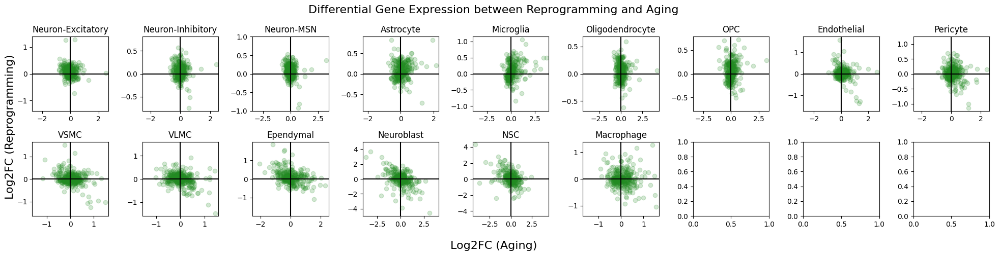

In [38]:
nrows = 2
ncols = 9

fig, axs = plt.subplots(2, 9, figsize=(20,5), sharex=False, sharey=False)

counter = 0
for i in range(nrows):
    for j in range(ncols):
        
        if counter < len(overlap_keys):
        
            celltype = overlap_keys[counter]

            # get stats
            aging_gene_log2fc = np.log2(dgea_dict_reprogramming[celltype]['foldchange_OCYC'])
            exercise_gene_log2fc = np.log2(1/np.array(dgea_dict_reprogramming[celltype]['foldchange_OCOR']))

            axs[i,j].scatter(aging_gene_log2fc, exercise_gene_log2fc, c='forestgreen', alpha=0.2)
            axs[i,j].axvline(0, color='k')
            axs[i,j].axhline(0, color='k')
            axs[i,j].set_title(f'{celltype}')

            # set up symmetric rectangle
            ymin, ymax = axs[i,j].get_ylim()
            xmin, xmax = axs[i,j].get_xlim()
            axs[i,j].set_ylim(-np.max(np.abs([ymin,ymax])), np.max(np.abs([ymin,ymax])))
            axs[i,j].set_xlim(-np.max(np.abs([xmin,xmax])), np.max(np.abs([xmin,xmax])))
                
        counter += 1
        
fig.suptitle("Differential Gene Expression between Reprogramming and Aging", fontsize=16)
fig.supxlabel("Log2FC (Aging)", fontsize=16)
fig.supylabel("Log2FC (Reprogramming)", fontsize=16)
plt.tight_layout()
plt.savefig("plots/reprogramming/aging_vs_reprogramming_log2fc.pdf", bbox_inches='tight')
plt.show()